In [1]:
import matplotlib.pyplot as plt
import numpy as np
import librosa
import librosa.display
import IPython.display as ipd

In [2]:
FPATH = 'audio.wav'

In [3]:
ipd.Audio(FPATH)

In [4]:
audio, sample_rate = librosa.load(FPATH)

audio = audio[:sample_rate * 5]

audio.shape

(110250,)

# 1. Analysis in the time domain

## 1.1 Displaying Waveform

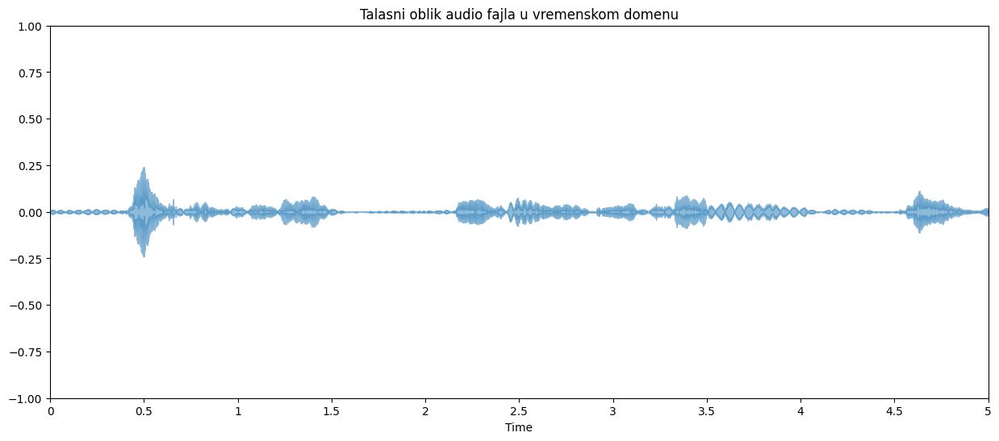

In [5]:
plt.figure(figsize=(15,6))

librosa.display.waveshow(audio, alpha=0.5, sr=sample_rate)
plt.ylim((-1, 1))
plt.xlim((0, len(audio)/sample_rate))
plt.title("Talasni oblik audio fajla u vremenskom domenu")

plt.show()

## 1.2 Amplitude Analysis

In [6]:
FRAME_SIZE = 256
HOP_LENGTH = 128

In [7]:
rms = librosa.feature.rms(y=audio, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

frames = range(len(rms))
t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH)

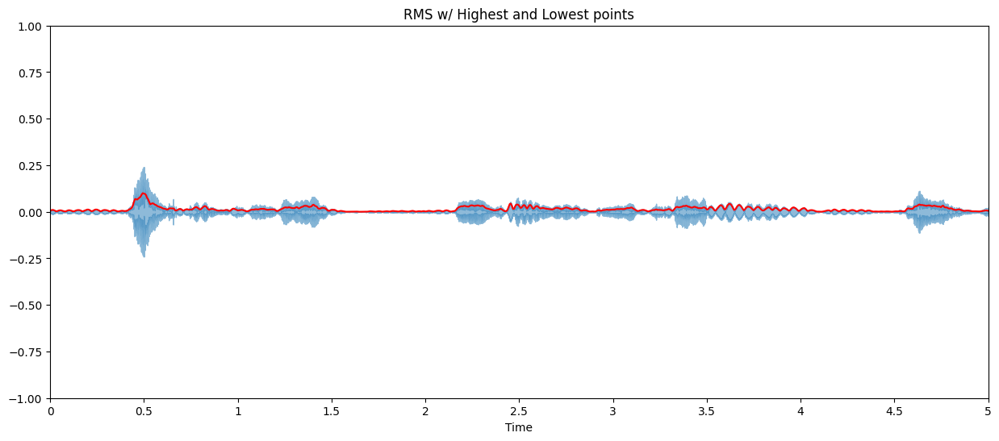

In [8]:
plt.figure(figsize=(15,6))

librosa.display.waveshow(audio, sr=sample_rate, alpha=0.5)
plt.plot(t, rms, color="r")

plt.ylim((-1, 1))
plt.xlim((0, len(audio)/sample_rate))
plt.title("RMS w/ Highest and Lowest points")

plt.show()

In [9]:
max_point = np.max(audio) 
min_point = np.min(audio) 

avg_amplitude = np.mean(np.abs(audio))

print(f"Highest point: {max_point}")
print(f"Lowest point: {min_point}")
print(f"Average amplitude: {avg_amplitude}")

Highest point: 0.2049708366394043
Lowest point: -0.24049408733844757
Average amplitude: 0.012561400420963764


# 1.3 Marking distinguishable sounds

In [10]:
import librosa
import numpy as np
import matplotlib.pyplot as plt

def detect_distinguishable_sounds(audio, sr, P=3, Q=5, R=6, init_duration=.1, window_duration=.01):
    # Read the first init_duration seconds of an audio file
    init_sample_count = int(sr * init_duration)
    init_segment = audio[:init_sample_count]
    
    # Set noise level to mean energy value + 2 standard deviations
    noise_level = np.mean(init_segment**2) + 2 * np.std(init_segment**2)

    # Number of samples in each window
    window_sample_count = int(sr * window_duration)
    # Total number of windows
    num_windows = len(audio) // window_sample_count

    # Pass 1: 
    sound_regions = []
    count_zeros = 0  # Number of consecutive noises
    ones_before = 0 # Number of distinguishable sounds before a sequence of detected noises
    
    for i in range(num_windows):
        # Read the window
        start = i * window_sample_count
        end = (i + 1) * window_sample_count
        window = audio[start:end]

        # Mean window energy
        window_energy = np.mean(window**2)
        
       

        # Sound detected
        if window_energy > noise_level:
            sound_regions.append(1)
            resulting_sequence_length = count_zeros + ones_before + 1

            # If the sound is detected and before it there were less than P consecutive noises -> 
            # Raise noise to sound (if length of the sound is higher than R)
            if count_zeros < P and resulting_sequence_length > R:
                for j in range(i - count_zeros, i):
                    sound_regions[j] = 1

            ones_before += 1
            count_zeros = 0
        # Noise detected
        else:
            sound_regions.append(0)
            count_zeros += 1

    # Pass 2: Additional alignment
    start_idx = -1 # Start index of ones

    for i in range(len(sound_regions)):
        # if we find the sequence of ones that is less than Q, we lower them to zeros
        if sound_regions[i] == 1:
            if start_idx == -1:
                start_idx = i
        else:
            if start_idx != -1:
                sequence_length = i - start_idx
                if sequence_length < Q:
                    for j in range(start_idx, i):
                        sound_regions[j] = 0
                start_idx = -1

    # Checking the last window
    if start_idx != -1:
        sequence_length = len(sound_regions) - start_idx
        if sequence_length < Q:
            for j in range(start_idx, len(sound_regions)):
                sound_regions[j] = 0
    

    # Conversion to regions
    regions = []
    start = None
    for i, val in enumerate(sound_regions):
        if val == 1 and start is None:
            start = i * window_duration
        elif val == 0 and start is not None:
            end = i * window_duration
            regions.append((start, end))
            start = None
    if start is not None:
        regions.append((start, len(y) / sr))

    return regions



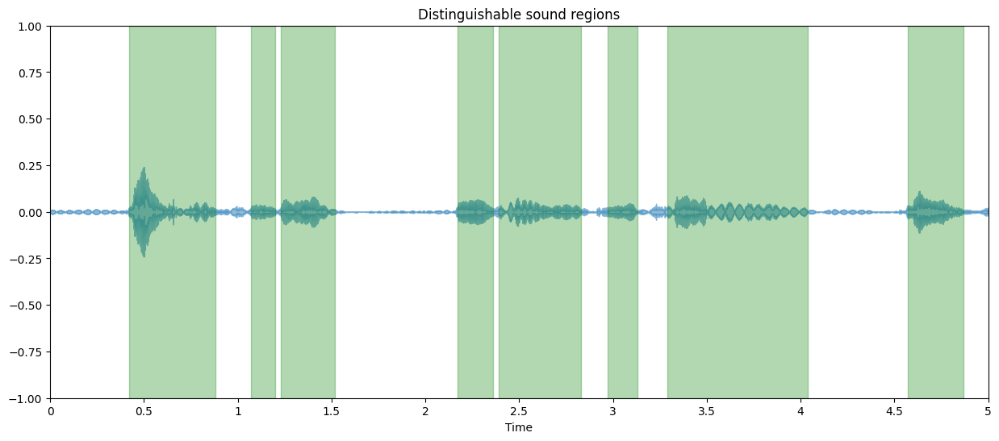

In [11]:
dinstinguishable_sound_regions = detect_distinguishable_sounds(audio, sample_rate, Q=6)

plt.figure(figsize=(15,6))

librosa.display.waveshow(audio, sr=sample_rate, alpha=0.5)

for (start, end) in dinstinguishable_sound_regions:
    plt.axvspan(start, end, color='green', alpha=0.3)

plt.ylim((-1, 1))
plt.xlim((0, len(audio)/sample_rate))

plt.title('Distinguishable sound regions')
plt.show()


## 1.4 Zero-Crossing Rate

In [12]:
zcr = librosa.feature.zero_crossing_rate(y=audio, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

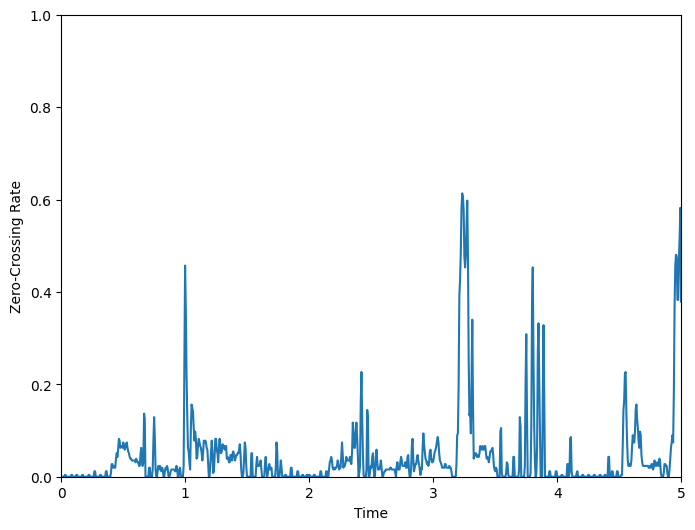

In [13]:
plt.figure(figsize=(8,6))

plt.plot(t, zcr)
plt.ylim(0, 1)
plt.xlim((0, len(audio)/sample_rate))
plt.ylabel("Zero-Crossing Rate")
plt.xlabel("Time")
plt.show()

# 2. Analysis in the frequency domain

## 2.1 Displaying Spectogram

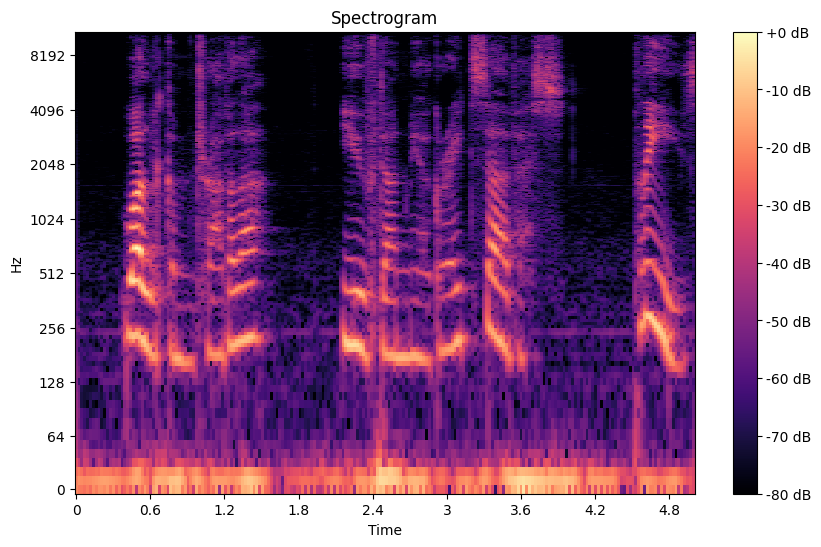

In [33]:
D = librosa.stft(audio) # Short time Fourier transformation

# Convert the amplitude to decibels (dB)
D_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

# Plot the spectrogram
plt.figure(figsize=(10, 6))
librosa.display.specshow(D_db, sr=sample_rate, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram')
plt.show()

## 2.2 Finding the Fundamental frequency

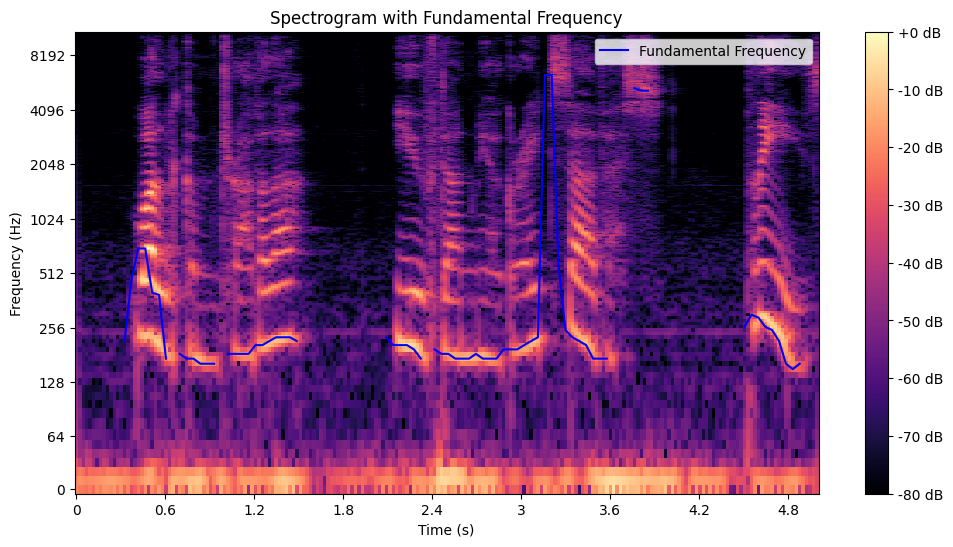

In [71]:
FRAME_SIZE = 2048
HOP_LENGTH = 1024

FREQ_THRESHOLD = 50
K = 3

# Store fundamental frequencies
fundamental_frequencies = []

# Loop over frames
for i in range(0, len(audio) - FRAME_SIZE, HOP_LENGTH):
    # Extract the current frame
    frame = audio[i:i + FRAME_SIZE]
    
    # Compute the Fourier Transform and corresponding frequencies
    spectrum = np.abs(np.fft.fft(frame))[:FRAME_SIZE // 2]  # Take only positive frequencies
    freqs = np.fft.fftfreq(FRAME_SIZE, d=1/sample_rate)[:FRAME_SIZE // 2] # Gives frequencies
    
    sorted_indices = np.argsort(spectrum)[::-1]  # Indices of sorted magnitudes

    # Find the first frequency above the threshold
    selected_freq = np.nan
    for i, idx in enumerate(sorted_indices):
        if freqs[idx] >= FREQ_THRESHOLD:
            selected_freq = freqs[idx]
            break
        if i>=K:
            break
    
    # Append the selected frequency or NaN if none found above threshold
    fundamental_frequencies.append(selected_freq)

# Create a time axis for plotting
times = np.arange(len(fundamental_frequencies)) * (HOP_LENGTH / sample_rate)

plt.figure(figsize=(12, 6))

# Plot the spectrogram
D = librosa.stft(audio)
D_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
librosa.display.specshow(D_db, sr=sample_rate, x_axis='time', y_axis='log')

# Plot the fundamental frequency
plt.plot(times, fundamental_frequencies, label="Fundamental Frequency", color='b')

plt.title("Spectrogram with Fundamental Frequency")
plt.colorbar(format='%+2.0f dB')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.legend()
plt.legend()
plt.show()


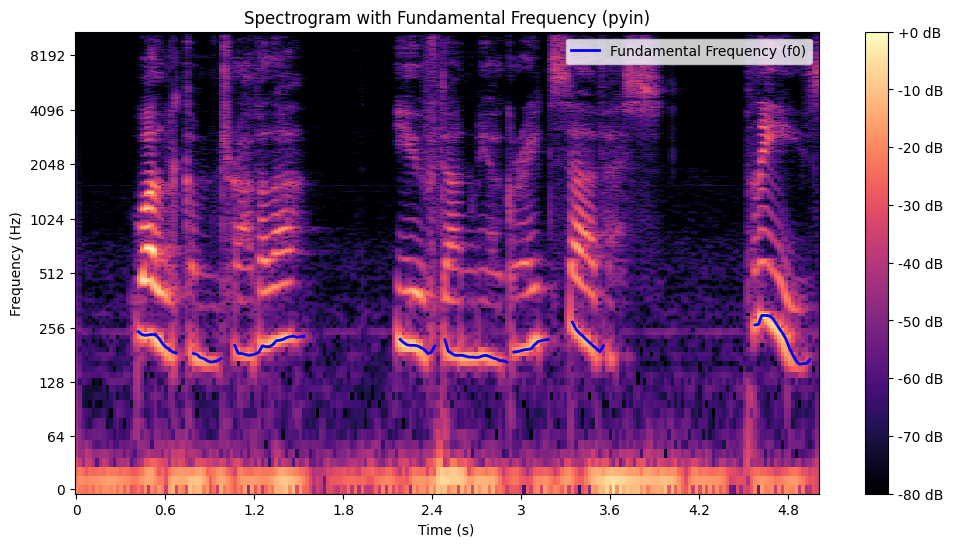

In [ ]:
# Compute the fundamental frequency
f0, _, _ = librosa.pyin(audio, fmin=librosa.note_to_hz('C1'), fmax=librosa.note_to_hz('C8'))

# Create a time axis for plotting
times = librosa.times_like(f0, sr=sample_rate)

# Plot the spectrogram
plt.figure(figsize=(12, 6))

# Plot the spectrogram
D = librosa.stft(audio)
D_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
librosa.display.specshow(D_db, sr=sample_rate, x_axis='time', y_axis='log')

# Plot the fundamental frequency (f0)
plt.plot(times, f0, label='Fundamental Frequency', color='b', linewidth=2)

plt.colorbar(format='%+2.0f dB')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.title('Spectrogram with Fundamental Frequency (pyin)')
plt.legend()

plt.show()